In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import glob
from imp import reload

import gbeflow

In [3]:
files = glob.glob('../data/*.czi')
files

['../data/20180108_htl_glc_sc11_mmzm.czi',
 '../data/20180112_htlglc_tl_sc19_mmzp.czi',
 '../data/20180110_htl_glc_sc14_mmzp.czi',
 '../data/20180110_htl_glc-Create Image Subset-02_sc11_htl.czi',
 '../data/20180112_htlglc_tl_sc11_mmzp.czi',
 '../data/20180110_htl_glc_sc15_mmzm.czi',
 '../data/20180110_htl_glc-Create Image Subset-01_sc10_wt.czi',
 '../data/20180108_htl_glc_sc9_mmzp.czi',
 '../data/20180112_htlglc_tl_sc4_resille.czi',
 '../data/20180110_htl_glc_sc6_mmzm.czi',
 '../data/20180108_htl_glc_sc2_mmzm_wp.czi']

# Import czi data

In [40]:
reload(gbeflow)

<module 'gbeflow' from '/Users/morganschwartz/Code/germband-extension/gbeflow/__init__.py'>

In [42]:
raw = {}
for f in files:
    raw[f] = gbeflow.CziImport(f)
    print(f)


            There are 1 ROIs,
                       2 channels and
                       156 timepoints.
            
(1, 1, 2, 156, 1, 1024, 1024, 1)

            The 3D dimensions of the data are:
            1 x 1024 x 1024 (zyx)
            
../data/20180108_htl_glc_sc11_mmzm.czi

            There are 1 ROIs,
                       2 channels and
                       169 timepoints.
            
(1, 1, 2, 169, 1, 1024, 1024, 1)

            The 3D dimensions of the data are:
            1 x 1024 x 1024 (zyx)
            
../data/20180112_htlglc_tl_sc19_mmzp.czi

            There are 1 ROIs,
                       1 channels and
                       167 timepoints.
            
(1, 1, 1, 167, 2, 1, 1024, 1024, 1)

            The 3D dimensions of the data are:
            1 x 1024 x 1024 (zyx)
            
../data/20180110_htl_glc_sc14_mmzp.czi

            There are 1 ROIs,
                       1 channels and
                       167 timepoints.
            
(1, 1, 1, 

# Save raw brightfield data to hdf5 files

In [18]:
raw[f].shape

(2, 156, 1024, 1024)

Check which channel has brightfield data

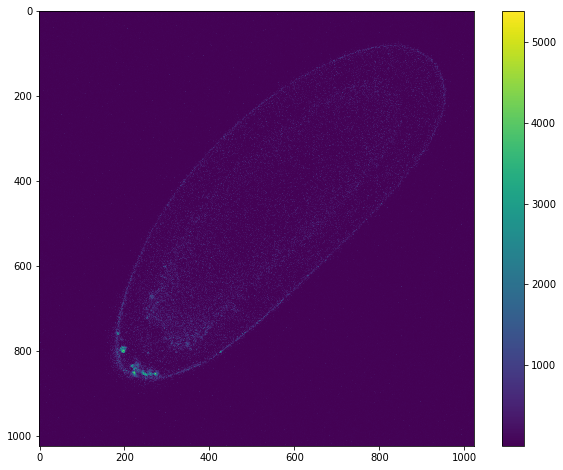

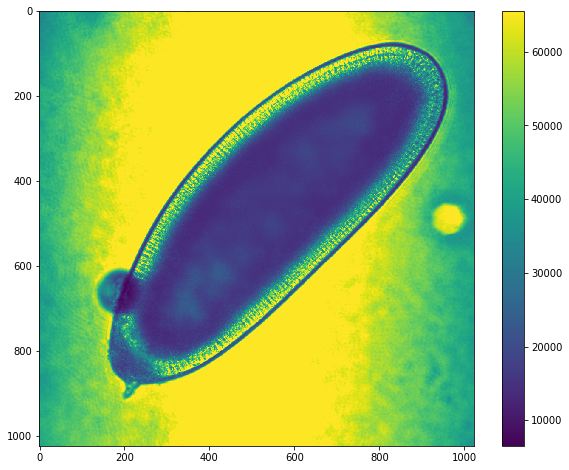

In [14]:
gbeflow.imshow(raw[f][0,0])
gbeflow.imshow(raw[f][1,0])

Save brightfield channel to h5 files

In [16]:
for f in files:
    # Define output name with h5 file type
    name = f[:-3]+'h5'
    # Write only brightfield channel to h5 file
    gbeflow.write_hyperstack(raw[f][1],name)
    print(name)

../data/20180108_htl_glc_sc11_mmzm.h5
../data/20180112_htlglc_tl_sc19_mmzp.h5
../data/20180110_htl_glc_sc14_mmzp.h5
../data/20180110_htl_glc-Create Image Subset-02_sc11_htl.h5
../data/20180112_htlglc_tl_sc11_mmzp.h5
../data/20180110_htl_glc_sc15_mmzm.h5
../data/20180110_htl_glc-Create Image Subset-01_sc10_wt.h5
../data/20180108_htl_glc_sc9_mmzp.h5
../data/20180112_htlglc_tl_sc4_resille.h5
../data/20180110_htl_glc_sc6_mmzm.h5
../data/20180108_htl_glc_sc2_mmzm_wp.h5


# Get a look at the new files

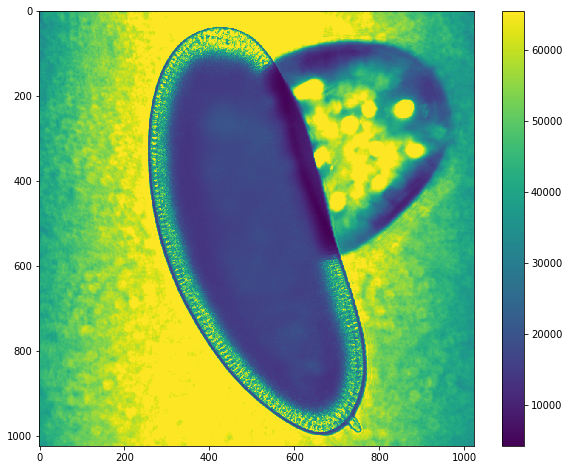

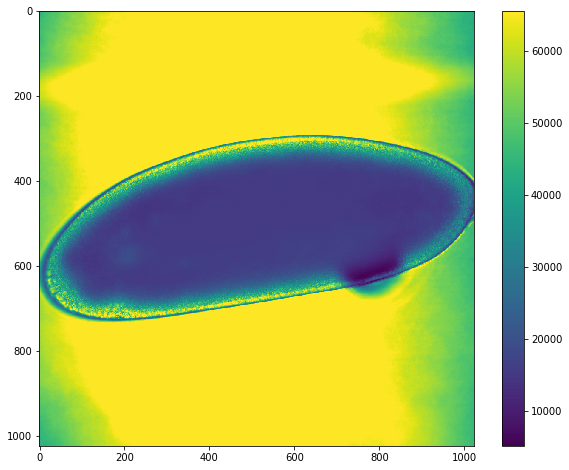

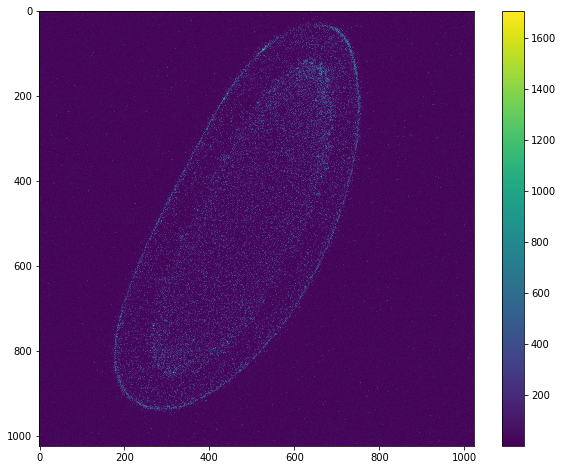

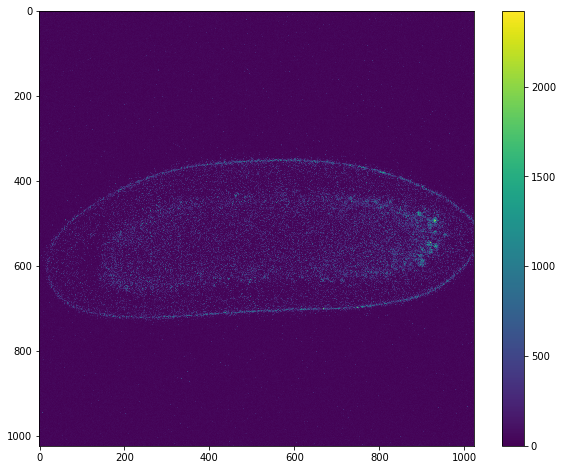

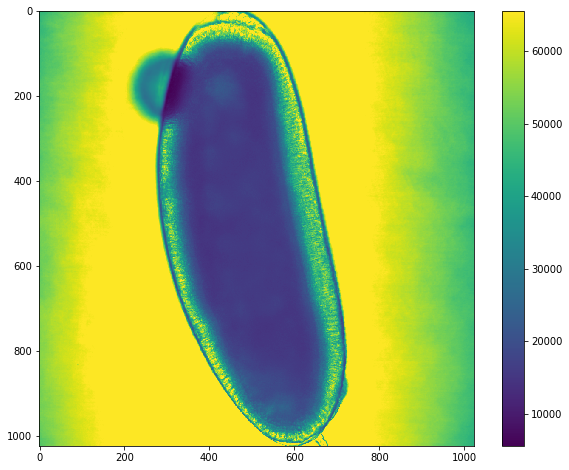

...

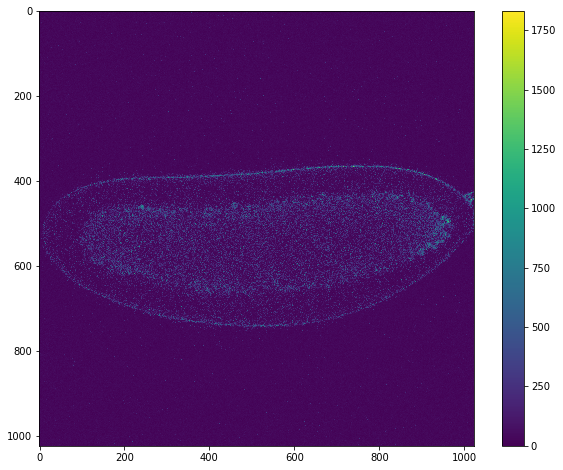

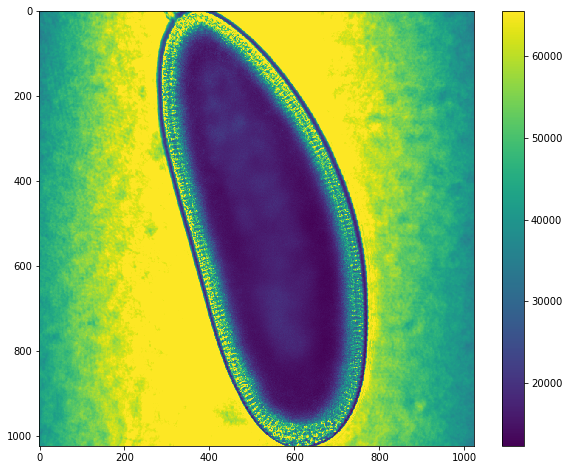

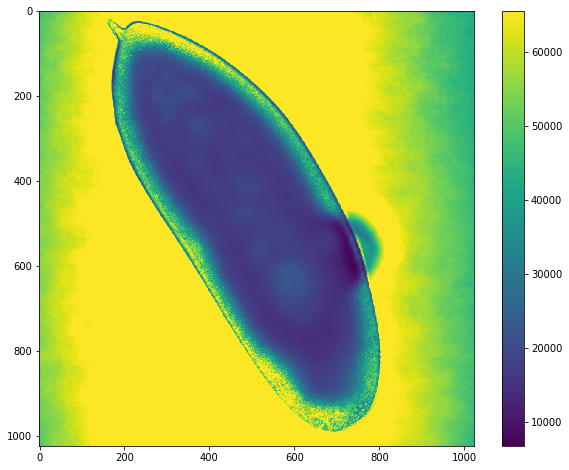

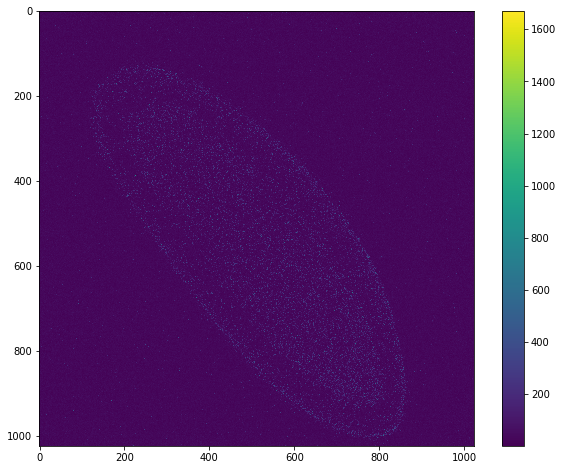

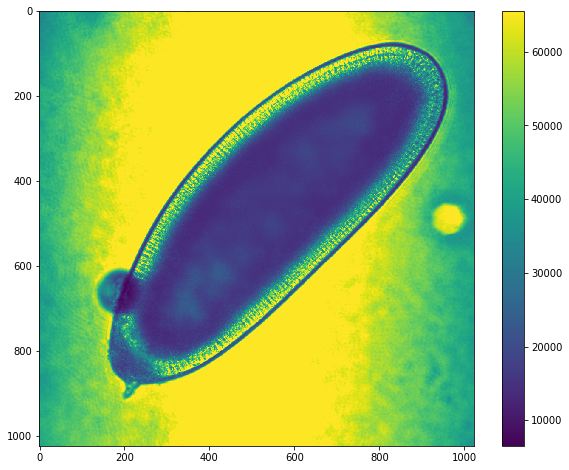

In [19]:
for f in files:
    gbeflow.imshow(raw[f][1,0])

It looks like its not safe to assume that the brightfield channel is stored as the second dataset. Instead I think we can look at the maximum intensity value to distinguish the channels. Brightfield data have a maximum value around $10^4$ compared to autofluoresence around $10^3$.

# Resave data files using a threshold to pick the correct channel

In [38]:
raw[f][1,0].max()

65535

In [30]:
brt = {}
for f in files:
    name = f[:-3]+'h5'
    print(name)
    
    # Check maximum intensity value of first time point in first channel
    mx = raw[f][0,0].max()
    print(mx)
    
    if mx > 10**4:
        # If greater than 10^4 save first channel
#         gbeflow.write_hyperstack(raw[f][0],name)
        brt[f] = raw[f][0]
    else:
#         gbeflow.write_hyperstack(raw[f][1],name)
        brt[f] = raw[f][1]
        
    print(brt[f][0].max())

../data/20180108_htl_glc_sc11_mmzm.h5
1863
65535
../data/20180112_htlglc_tl_sc19_mmzp.h5
1102
65535
../data/20180110_htl_glc_sc14_mmzp.h5
1624
1706
../data/20180110_htl_glc-Create Image Subset-02_sc11_htl.h5
2501
2422
../data/20180112_htlglc_tl_sc11_mmzp.h5
1757
65535
../data/20180110_htl_glc_sc15_mmzm.h5
2594
2149
../data/20180110_htl_glc-Create Image Subset-01_sc10_wt.h5
1880
1831
../data/20180108_htl_glc_sc9_mmzp.h5
3616
65535
../data/20180112_htlglc_tl_sc4_resille.h5
4940
65535
../data/20180110_htl_glc_sc6_mmzm.h5
1096
1671
../data/20180108_htl_glc_sc2_mmzm_wp.h5
5386
65535


Let's check that these channel assignments worked correctly.

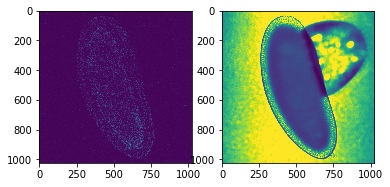

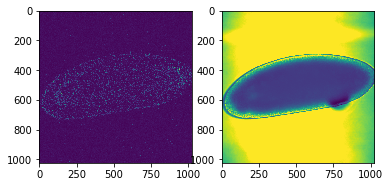

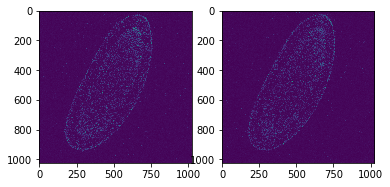

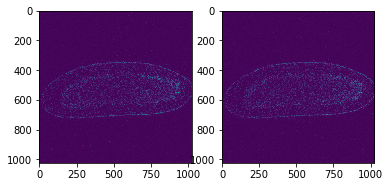

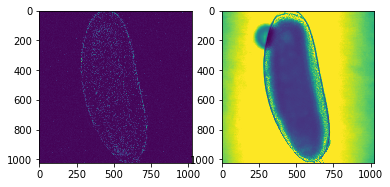

...

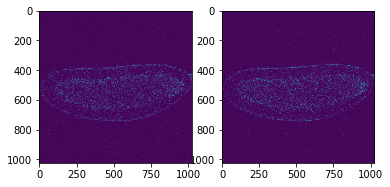

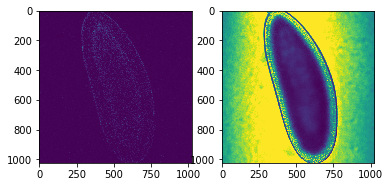

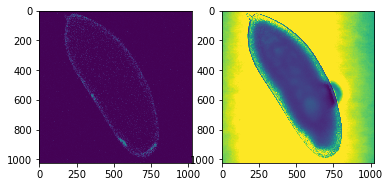

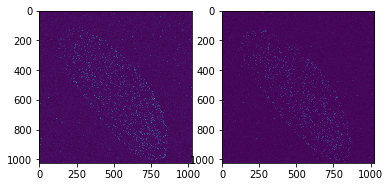

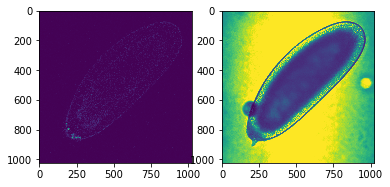

In [39]:
for f in files:
    fig,ax = plt.subplots(1,2)
    ax[0].imshow(raw[f][0,0])
    ax[1].imshow(raw[f][1,0])

It looks like some of the samples have the 488 channel in the place of both channels. Let's look back at the original czi import data to see what's going on.

In [44]:
for f in files:
    print(raw[f].raw_im.shape)

(1, 1, 2, 156, 1, 1024, 1024, 1)
(1, 1, 2, 169, 1, 1024, 1024, 1)
(1, 1, 1, 167, 2, 1, 1024, 1024, 1)
(1, 1, 1, 167, 2, 1, 1024, 1024, 1)
(1, 1, 2, 169, 1, 1024, 1024, 1)
(1, 1, 1, 167, 2, 1, 1024, 1024, 1)
(1, 1, 1, 167, 2, 1, 1024, 1024, 1)
(1, 1, 2, 156, 1, 1024, 1024, 1)
(1, 1, 2, 169, 1, 1024, 1024, 1)
(1, 1, 1, 167, 2, 1, 1024, 1024, 1)
(1, 1, 2, 156, 1, 1024, 1024, 1)


I was assuming that the channel data was stored in the third dimension, but it looks like it can also appear in the fourth dimension in some cases. The `gbeflow.CziImport` class uses the function `np.squeeze` to collapse the dimensions have a length of 1. Let's see what the output of that function looks like.

In [45]:
for f in files:
    print(raw[f].data.shape)

(2, 156, 1024, 1024)
(2, 169, 1024, 1024)
(167, 2, 1024, 1024)
(167, 2, 1024, 1024)
(2, 169, 1024, 1024)
(167, 2, 1024, 1024)
(167, 2, 1024, 1024)
(2, 156, 1024, 1024)
(2, 169, 1024, 1024)
(167, 2, 1024, 1024)
(2, 156, 1024, 1024)


The `np.squeeze` function preserves both the timepoint data and the channel data, but the dimensions appear to be swap. Let's look for a function that can switch dimensions.

There is a function `np.swapaxes(a,axis1,axis2)` that should work appropriately. I only need to check the lengths of the first two dimensions.

In [49]:
tst = raw[files[-2]].data
tst.shape

(167, 2, 1024, 1024)

In [51]:
np.swapaxes(tst,0,1).shape

(2, 167, 1024, 1024)

Let's reload `gbeflow` and check the new function.

In [56]:
reload(gbeflow)

<module 'gbeflow' from '/Users/morganschwartz/Code/germband-extension/gbeflow/__init__.py'>

In [57]:
raw = {}
for f in files:
    raw[f] = gbeflow.CziImport(f,summary=False)
    print(raw[f].data.shape)

(2, 156, 1024, 1024)
(2, 169, 1024, 1024)
(2, 167, 1024, 1024)
(2, 167, 1024, 1024)
(2, 169, 1024, 1024)
(2, 167, 1024, 1024)
(2, 167, 1024, 1024)
(2, 156, 1024, 1024)
(2, 169, 1024, 1024)
(2, 167, 1024, 1024)
(2, 156, 1024, 1024)


The inclusion of `np.switchaxes` in the `squeeze_data` function worked to normalize the data structure. We can now proceed with selection of brightfield data.

# Select brightfield channels again

In [60]:
brt = {}
for f in files:
    name = f[:-3]+'h5'
    print(name)
    
    # Check maximum intensity value of first time point in first channel
    mx = raw[f].data[0,0].max()
    print(mx)
    
    if mx > 10**4:
        # If greater than 10^4 save first channel
#         gbeflow.write_hyperstack(raw[f][0],name)
        brt[f] = raw[f].data[0]
    else:
#         gbeflow.write_hyperstack(raw[f][1],name)
        brt[f] = raw[f].data[1]
        
    print(brt[f][0].max())

../data/20180108_htl_glc_sc11_mmzm.h5
1863
65535
../data/20180112_htlglc_tl_sc19_mmzp.h5
1102
65535
../data/20180110_htl_glc_sc14_mmzp.h5
1624
65535
../data/20180110_htl_glc-Create Image Subset-02_sc11_htl.h5
2501
65535
../data/20180112_htlglc_tl_sc11_mmzp.h5
1757
65535
../data/20180110_htl_glc_sc15_mmzm.h5
2594
65535
../data/20180110_htl_glc-Create Image Subset-01_sc10_wt.h5
1880
65535
../data/20180108_htl_glc_sc9_mmzp.h5
3616
65535
../data/20180112_htlglc_tl_sc4_resille.h5
4940
65535
../data/20180110_htl_glc_sc6_mmzm.h5
1096
65535
../data/20180108_htl_glc_sc2_mmzm_wp.h5
5386
65535


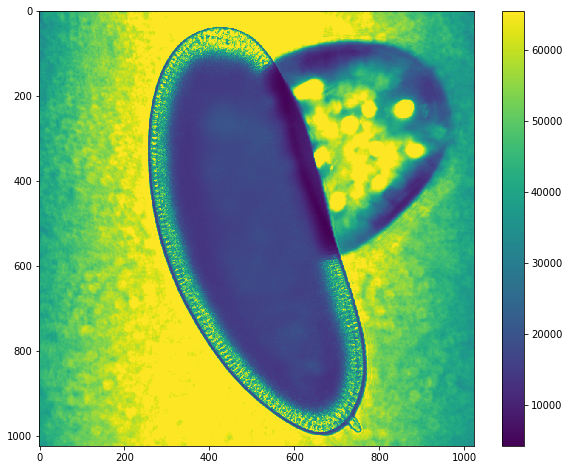

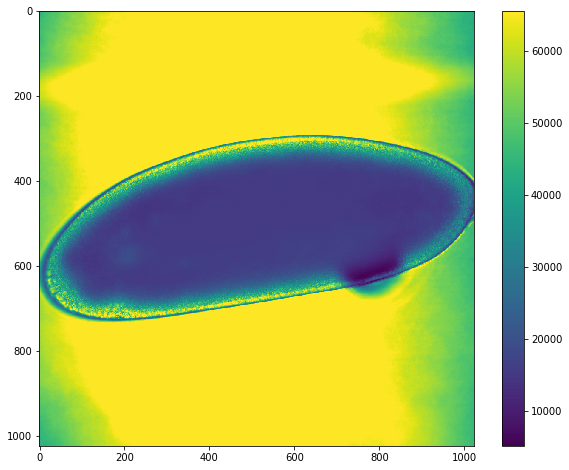

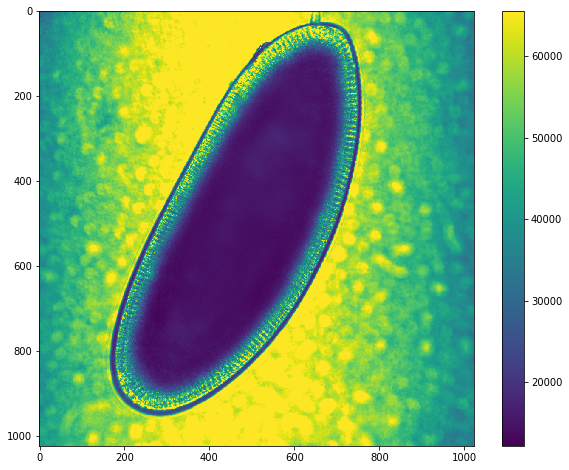

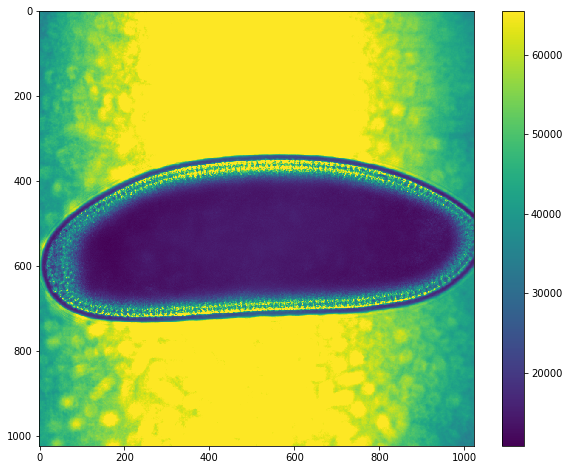

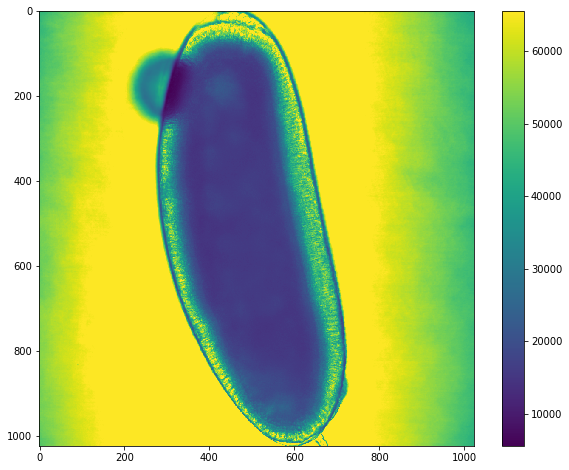

...

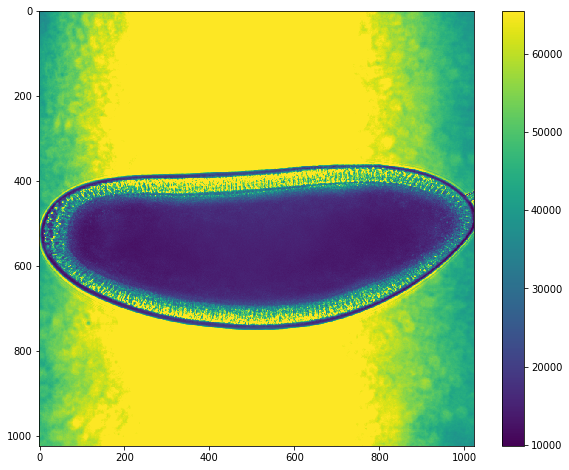

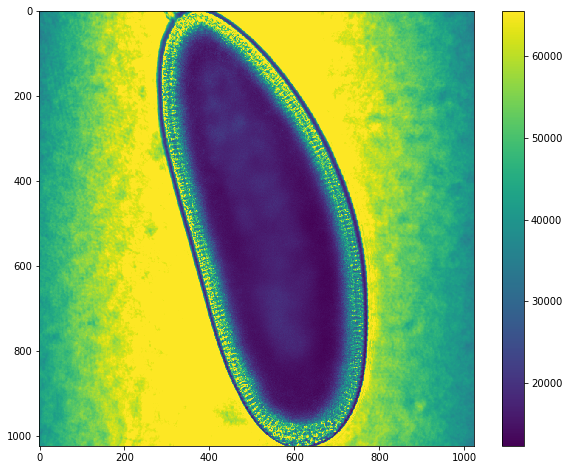

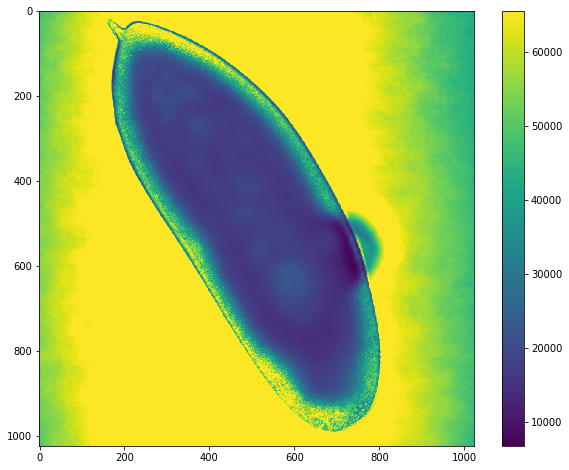

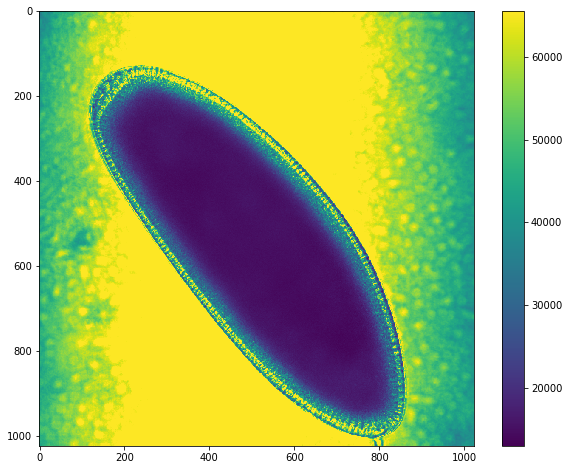

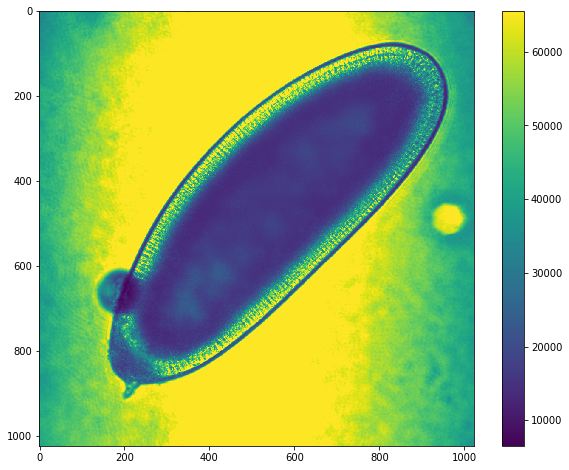

In [61]:
for f in files:
    gbeflow.imshow(brt[f][0])

It looks like we are now ready to go with masking. We won't be able to use a single ellipse for all samples because the embryos are positioned differently.

# Calculate ellipse

I'd like to see if we can fit a line to the embryo and use it to calculate an angle of rotation for the embryo. We can then rotate an ellipse to match the embryo.

## Fit best fit line

Fitting a best fit line on an image is more difficult than on a set of points. Let's first see if we can get away with just fitting a circle to the maximum shape of the image.

In [62]:
center = 1024/2
radius = 1024/2
ellipse = gbeflow.calc_ellipse(center,center,radius,radius)

Let's check how the contour performs on the first timepoint of each sample with this ellipse.

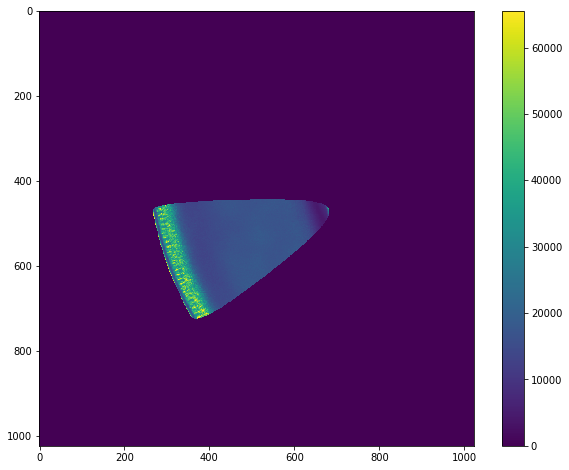

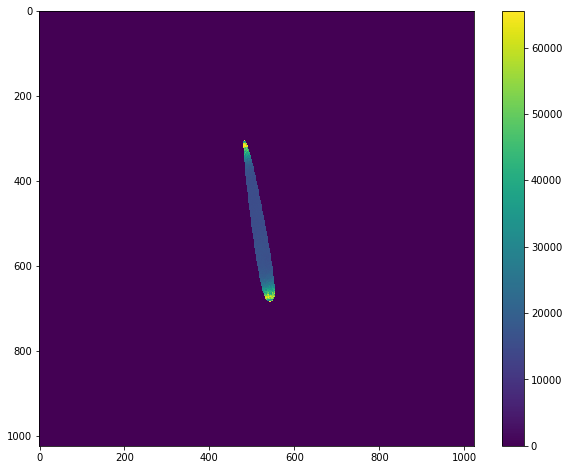

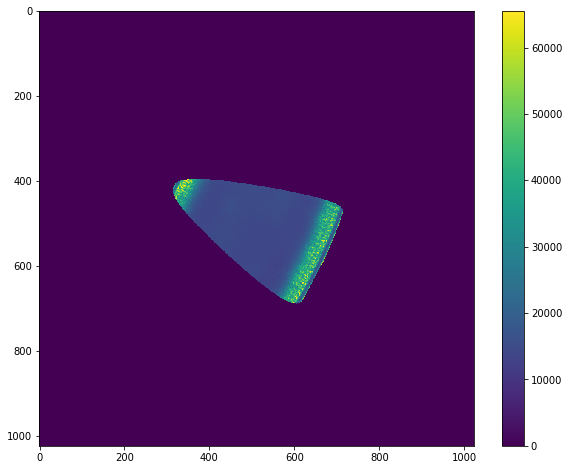

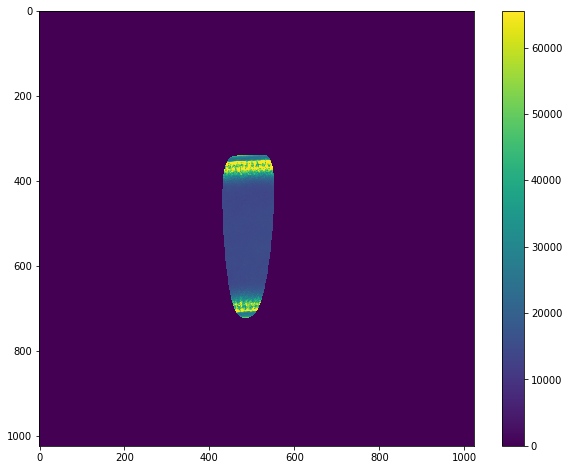

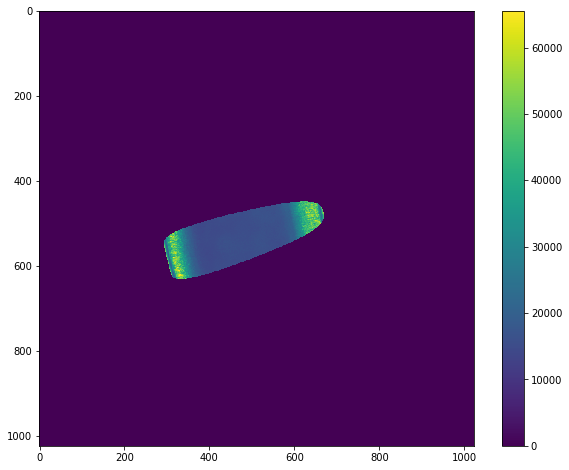

...

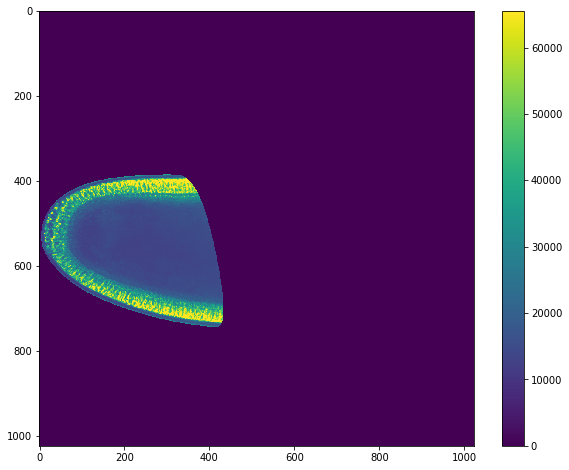

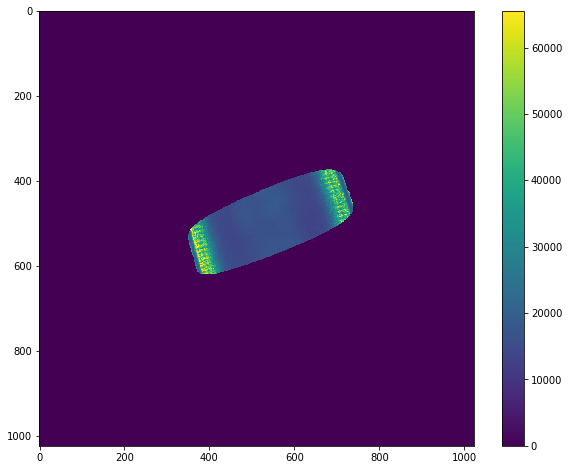

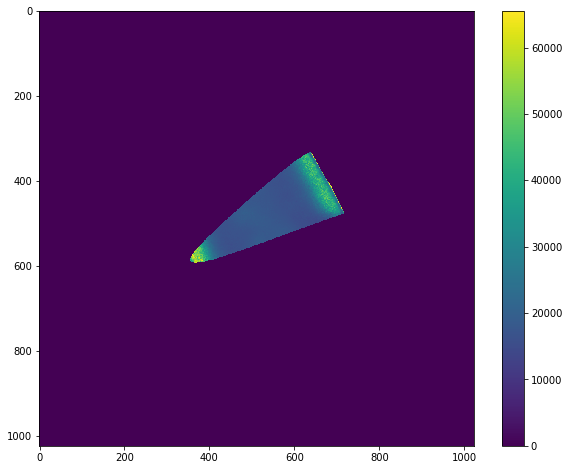

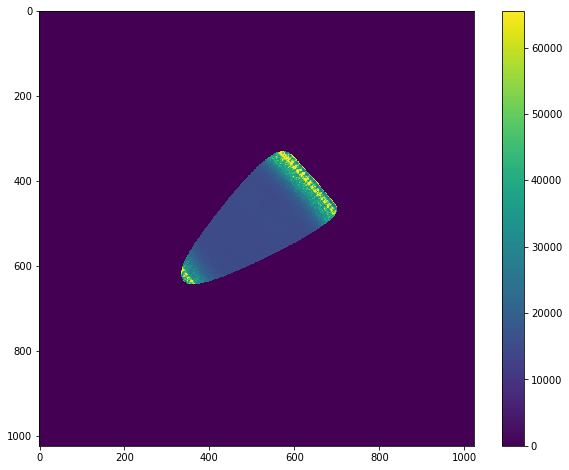

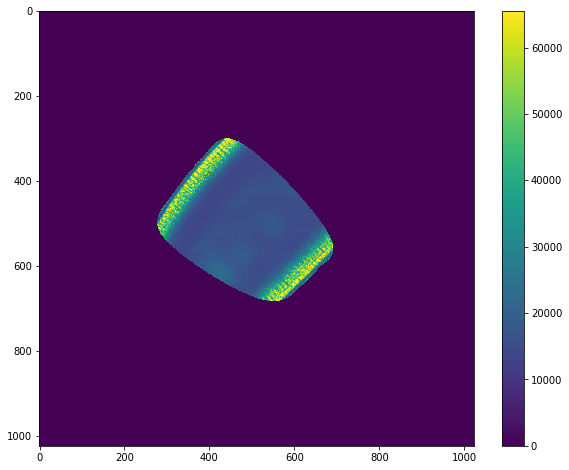

In [63]:
for f in files:
    gbeflow.imshow(gbeflow.contour_embryo(brt[f][0],ellipse))